# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

Чуть сложнее, чем обычно, но в целом норм(макс рябинин хорош)

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(np.sum(X, axis=1))
        L = D - X
        return np.linalg.eigh(L)[1][:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [3]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [4]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [5]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [6]:
from collections import defaultdict
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    stops = defaultdict(list)
    for id, row in data.iterrows():
        routes = row.RouteNumbers_en.split('; ')
        for route in routes:
            stops[route].append(id)
    return stops

def haversine_array(lat1, lng1, lat2, lng2):
    lat1 = np.radians(lat1)
    lng1 = np.radians(lng1)
    lat2 = np.radians(lat2)
    lng2 = np.radians(lng2)
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    sorted_routes = defaultdict(list)
    for route in routes:
        coords = data.loc[routes[route], ['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_numpy()
        distance = np.zeros((len(coords), len(coords)))
        for i in range(len(coords) - 1):
            for j in range(i + 1, len(coords)):
                    distance[i, j] = haversine_array(coords[i][0].item(), coords[i][1].item(), coords[j][0].item(), coords[j][1].item())
                    distance[j, i] = distance[i, j]
        start_stop = np.argmax(distance.sum(axis=1))
        distance[:, start_stop] = np.inf
        sorted_routes[route].append(routes[route][start_stop])
        for i in range(len(routes[route]) - 1):
            start_stop = np.argmin(distance[start_stop])
            sorted_routes[route].append(routes[route][start_stop])
            distance[:, start_stop] = np.inf
    return sorted_routes

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    n_samples = data['Name_en'].nunique()
    A = np.zeros((n_samples, n_samples))
    for route in sorted_routes:
        for i in range(len(sorted_routes[route]) - 1):
            A[sorted_routes[route][i], sorted_routes[route][i + 1]] += 1
            A[sorted_routes[route][i + 1], sorted_routes[route][i]] += 1
    return A

In [7]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [50]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
color = ['red', 'blue', 'green', 'orange', 'grey']
for i, route_id in enumerate(np.random.choice(list(sorted_routes.keys()), size=5)):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords, color=color[i]).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [23]:
import random
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    # https://stackoverflow.com/questions/28999287/generate-random-colors-rgb
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(len(np.unique(labels)))]
    for (id, row), label in zip(data.iterrows(), labels):
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en], radius=10, color=color[label]).add_to(map)
    return map 

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

Text(0, 0.5, '$J(C_k)$')

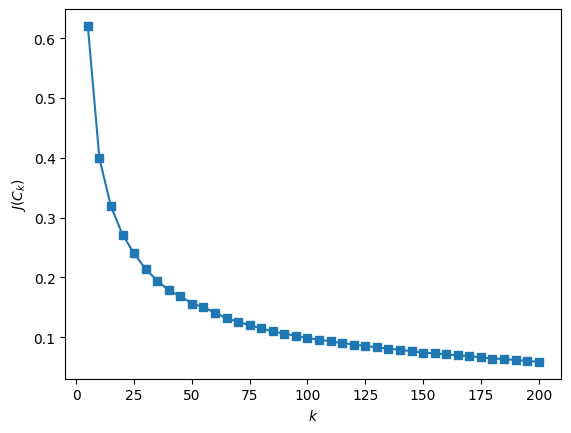

In [24]:
import matplotlib.pyplot as plt
rg = range(5, 205, 5)
inertia = []

X_smpl = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']]

for k in rg:
    kmeans = KMeans(n_clusters=k, random_state=1).fit(X_smpl)
    inertia.append(np.sqrt(kmeans.inertia_))
    
plt.plot(rg, inertia, marker='s')
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$')

Это значит, что всё плохо...

In [52]:
#k-means
from sklearn.cluster import KMeans

stop_coords = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']]
draw_clustered_map(data, KMeans(n_clusters=50, random_state=0, n_init="auto").fit_predict(stop_coords))

Из-за своей простоты kmeans не может адекватно найти кластеры (это можно видеть по графику локтя). Происходит это из-за того, что кластеры разной длины и формы, тяжело найти среднее.

In [53]:
from sklearn.cluster import DBSCAN

eps = 0.003 # будем считать, что расстояние между остановками 250-500 м
min_samples = 2 # берём следующую и будущую остановки

labels = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(stop_coords)
print("Number of outliers is", np.unique(labels, return_counts=True)[1][0])
draw_clustered_map(data, labels)

Number of outliers is 19


In [54]:
D = np.diag(adjacency_matrix.sum(1))
L = D - adjacency_matrix

np.linalg.eigh(L)[0][:5]

array([-5.73225898e-16, -3.79533343e-17,  9.50197099e-16,  1.41126898e-15,
        2.68189444e-03])

In [62]:
# spectral
graph_clustering = GraphClustering(n_clusters=70)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** 

1. K-means -- делает быстро, кластеры простые; ищет центры кластеров, но в нашем случае кластеры сложной формы и непонятно, что делать центр (остановку на половине маршрута?)
2. DBSCAN -- чуть дольше в скорости, сложнее задать параметры (но это можно воспринимать как вариативность), не очень понимаю, почему в данном случае он не подошёл (скорее всего плохо подобрал параметры)
3. Спектральная кластеризация -- самое долгое по скорости, результат лучше чем у дефолтного k-means, но количество кластеров надо взять побольше, ем K-means(что вообще-то не очень законно как будто), потому что если взять количество нулевых собственных чисел (можно сказать, что тут их почти 4), то получается прям фигня.

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [15]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
536,entertainment,027.txt,Lit Idol begins search for author,The second Pop Idol-style search for literary...
1632,sport,320.txt,France v Wales (Sat),"Stade de France, Paris Saturday, 26 February..."
559,entertainment,050.txt,Willis sues over movie 'injury',Actor Bruce Willis is suing Revolution Studio...
2086,tech,263.txt,Napster offers rented music to go,"Music downloading, for those that have reject..."
640,entertainment,131.txt,Franz man seeks government help,Franz Ferdinand frontman Alex Kapranos has ca...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [16]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [17]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/free001style/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/free001style/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/free001style/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [19]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [20]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

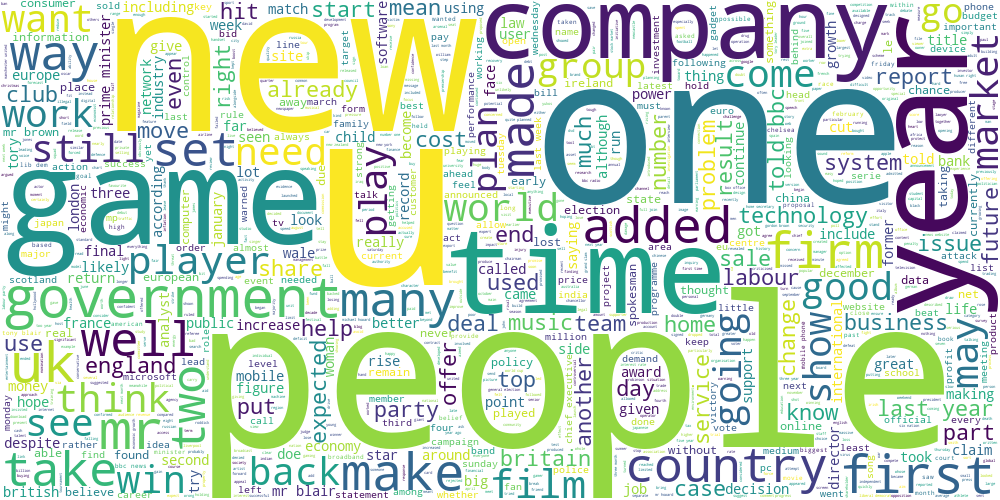

In [21]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** В целом очень неплохо, правда не все кластеры получились полностью интерпретируемыми:

1. политка
2. футбол
3. экономика/финансы
4. теннис
5. музыка
6. экономика/финансы
7. технологии
8. кинематограф

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=5)
X = vectorizer.fit_transform(data.text)

kmeans = KMeans()
labels = kmeans.fit_predict(X)

In [23]:
idx = defaultdict(list)

for i in range(len(labels)):
    idx[labels[i]].append(i)

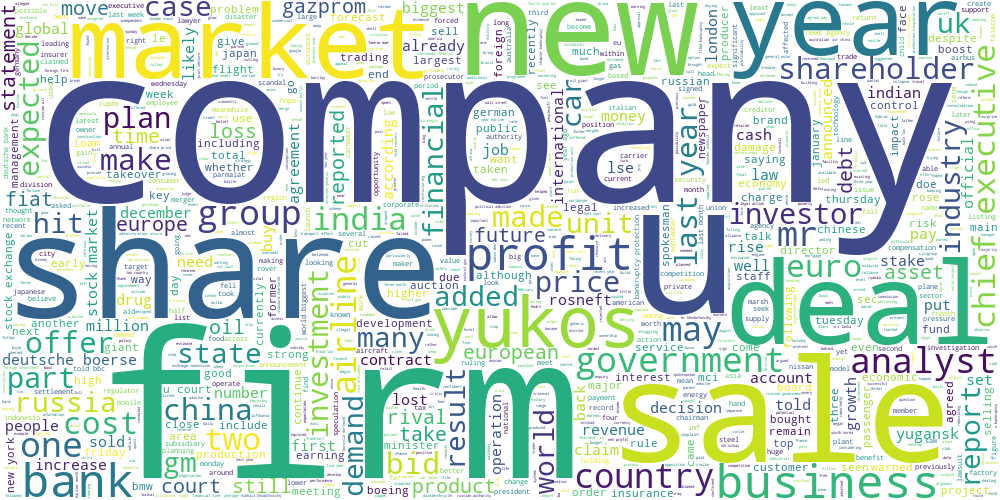

In [24]:
draw_wordcloud(data.text.iloc[idx[0]])

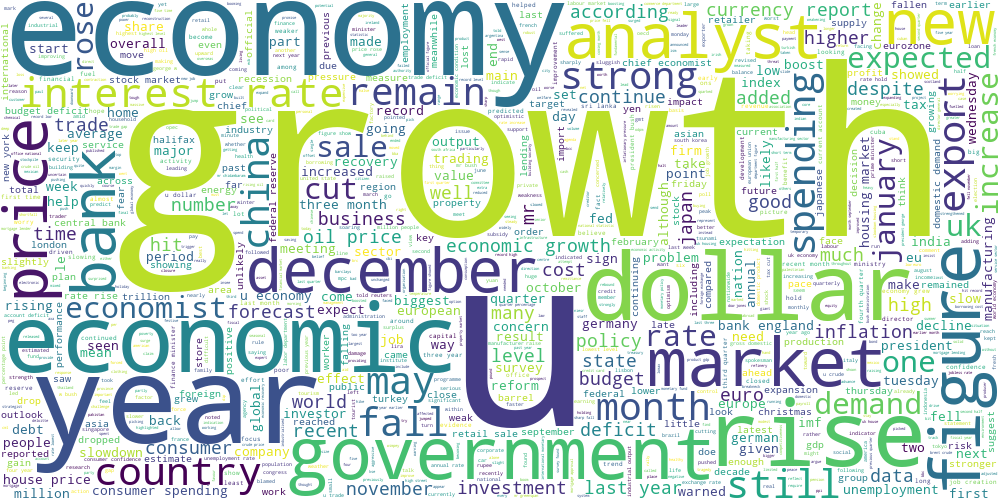

In [25]:
draw_wordcloud(data.text.iloc[idx[1]])

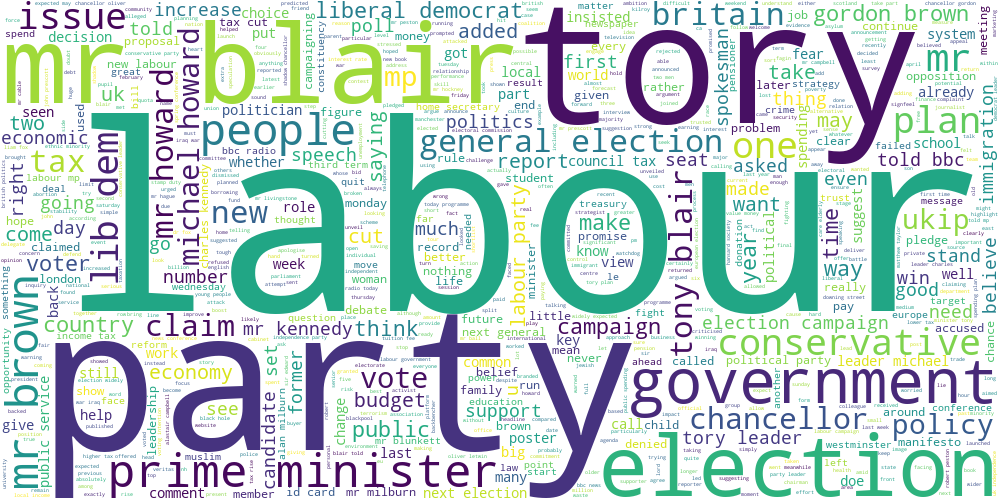

In [26]:
draw_wordcloud(data.text.iloc[idx[2]])

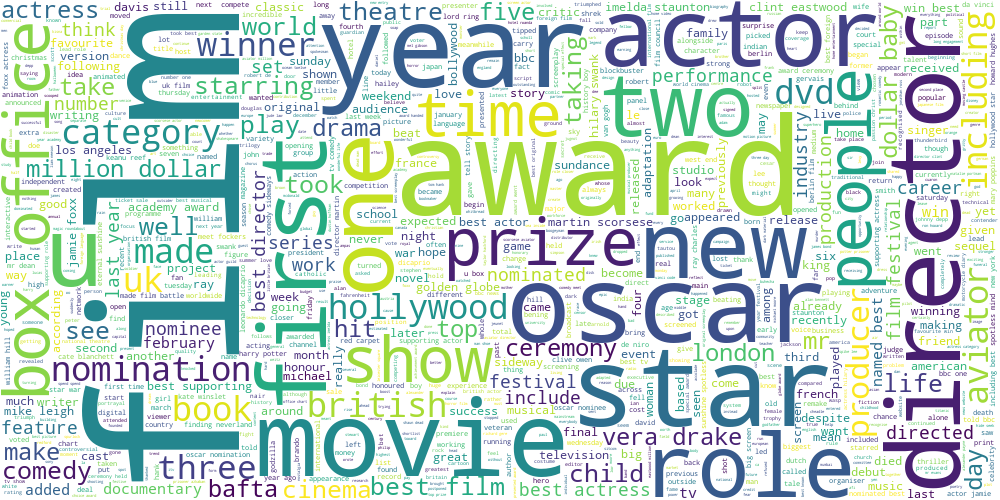

In [27]:
draw_wordcloud(data.text.iloc[idx[3]])

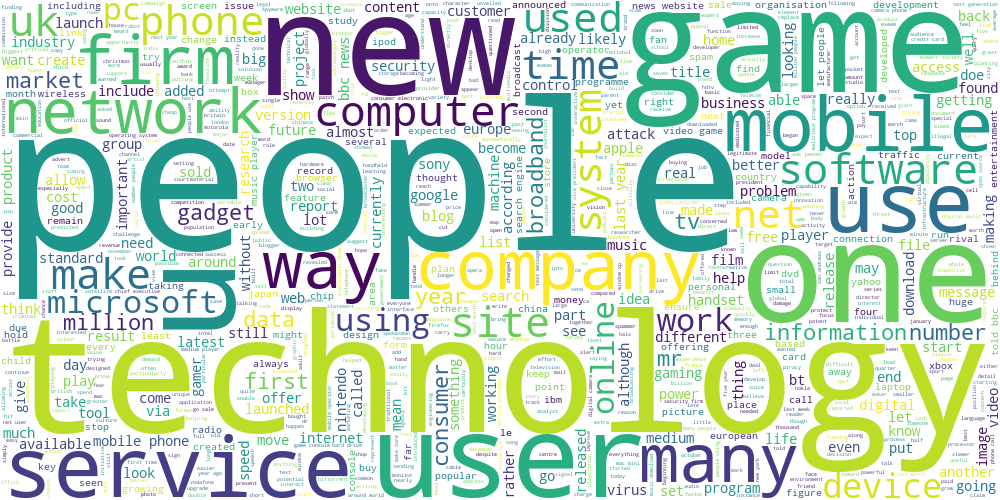

In [28]:
draw_wordcloud(data.text.iloc[idx[4]])

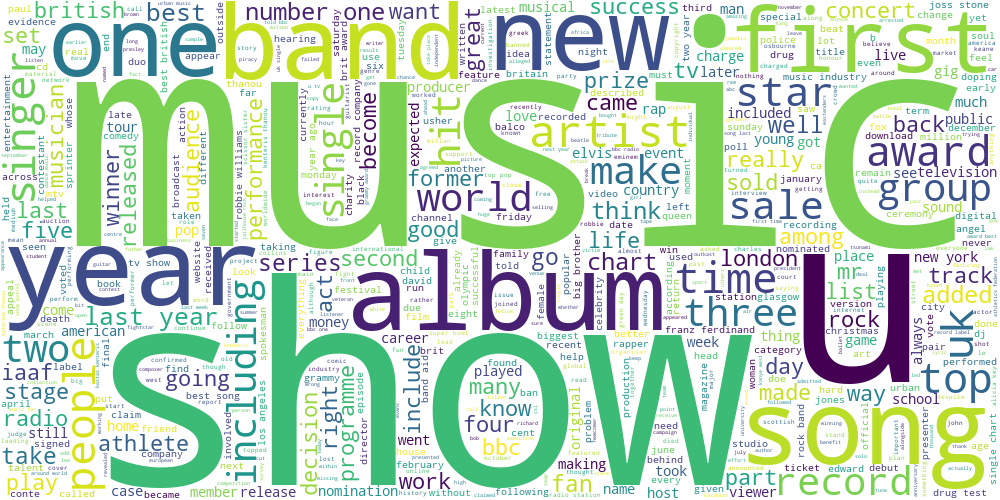

In [29]:
draw_wordcloud(data.text.iloc[idx[5]])

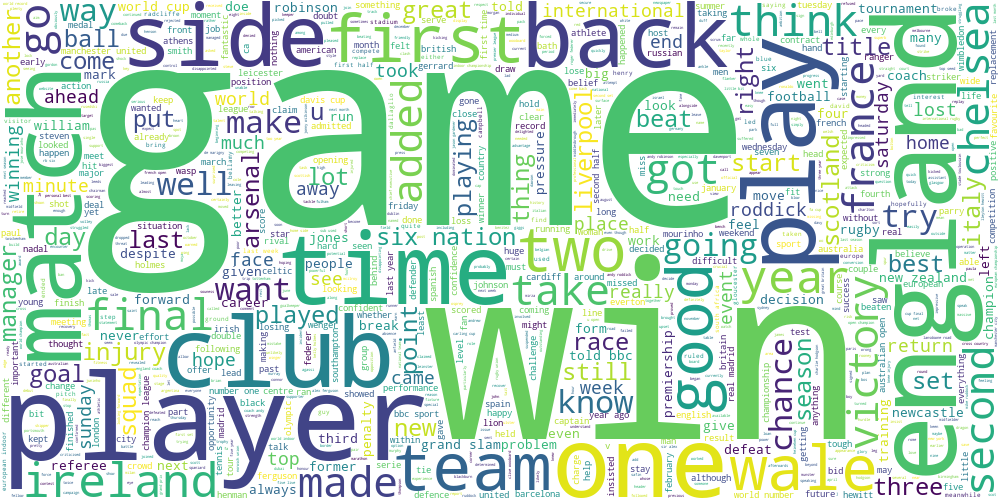

In [30]:
draw_wordcloud(data.text.iloc[idx[6]])

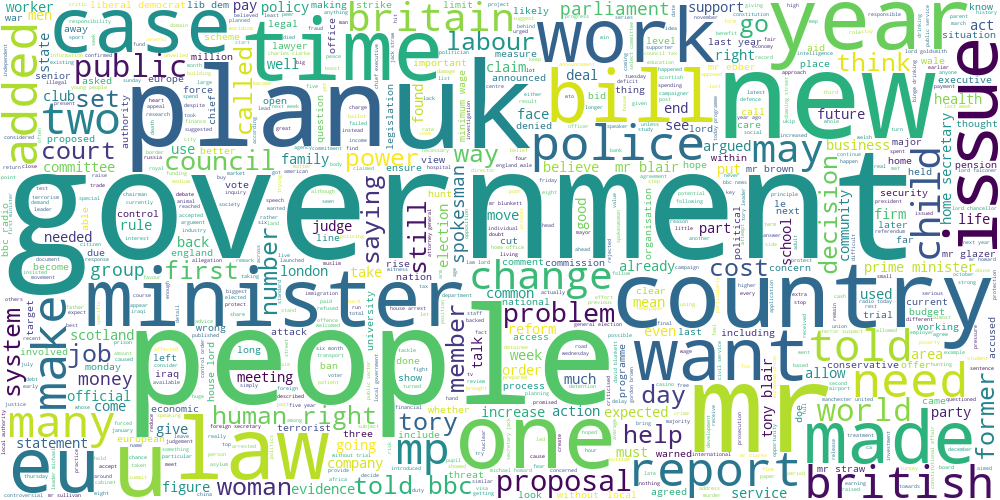

In [31]:
draw_wordcloud(data.text.iloc[idx[7]])

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Результаты неплохие, полученные слова присутствуют в tag cloud, правда они не всегда самые крупные (хз, в моей голове они должны быть прям центром облака)

In [32]:
vectorizer.get_feature_names_out()[kmeans.cluster_centers_.argmax(1)]

array(['company', 'economy', 'mr', 'film', 'mobile', 'music', 'game',
       'mr'], dtype=object)

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [33]:
from sklearn.cluster import SpectralClustering

kmeans_labels = labels

sc = SpectralClustering()
spectral_labels = sc.fit_predict(X)

dbscan = DBSCAN(eps=0.88)
dbscan_labels = dbscan.fit_predict(X) # 9 clusters

In [34]:
np.unique(dbscan_labels, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9]),
 array([2146,   12,    7,    6,    7,   10,    6,    5,    9,   12,    5]))

In [35]:
from sklearn.manifold import TSNE

X_new = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X)

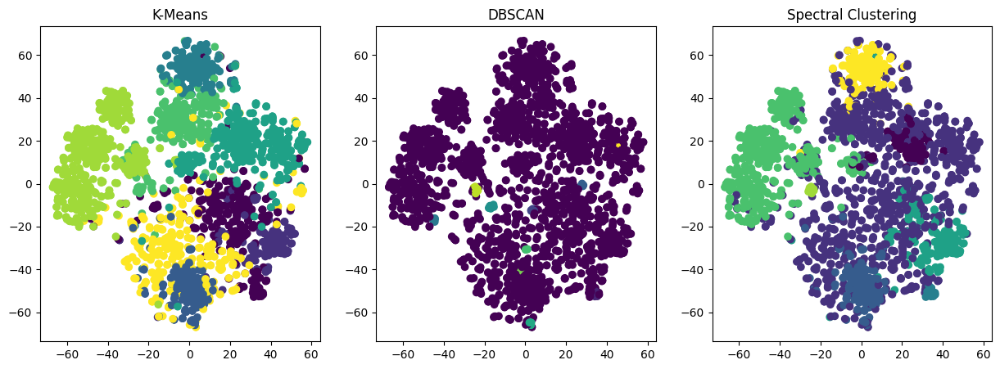

In [36]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].scatter(X_new[:,0], X_new[:, 1], c=kmeans_labels, label='K-Means')
ax[1].scatter(X_new[:,0], X_new[:, 1], c=dbscan_labels, label='DBSCAN')
ax[2].scatter(X_new[:,0], X_new[:, 1], c=spectral_labels, label='Spectral Clustering')
ax[0].set_title('K-Means')
ax[1].set_title('DBSCAN')
ax[2].set_title('Spectral Clustering')
plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** 

1. K-Means справился хорошо, у кластеров адекватная форма
2. DBSCAN почти все точки отправил в шум.
3. Спектральная кластеризация справилась хуже K-Means, светлофиалетового много получилось в центре.

Насчёт баланса кластеров: у kmeans есть два больших кластера, остальные 6 почти равномерные; у спектральной кластеризации есть один клас преобладающий класс (фиолетовый, о котором я выше писал), ну и остальных значительно меньше.

Результаты соотносятся с теми, что были в прошлом задании.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [37]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

bow = CountVectorizer(min_df=5).fit_transform(data.text)
lda = LatentDirichletAllocation(16)

lda_labels = lda.fit_transform(bow).argmax(1)

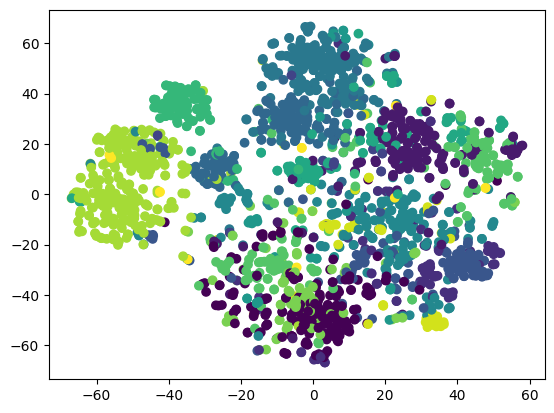

In [38]:
plt.scatter(X_new[:,0], X_new[:, 1], c=lda_labels)
plt.show()

Кластеры теперь сильнее пересекаются и уже не такие вытянутые

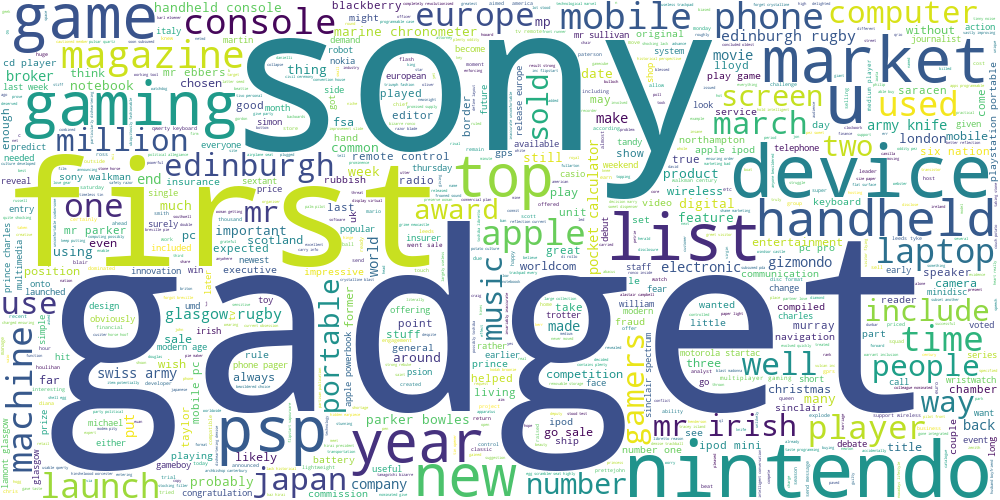

In [103]:
draw_wordcloud(data.text.loc[lda_labels==3])

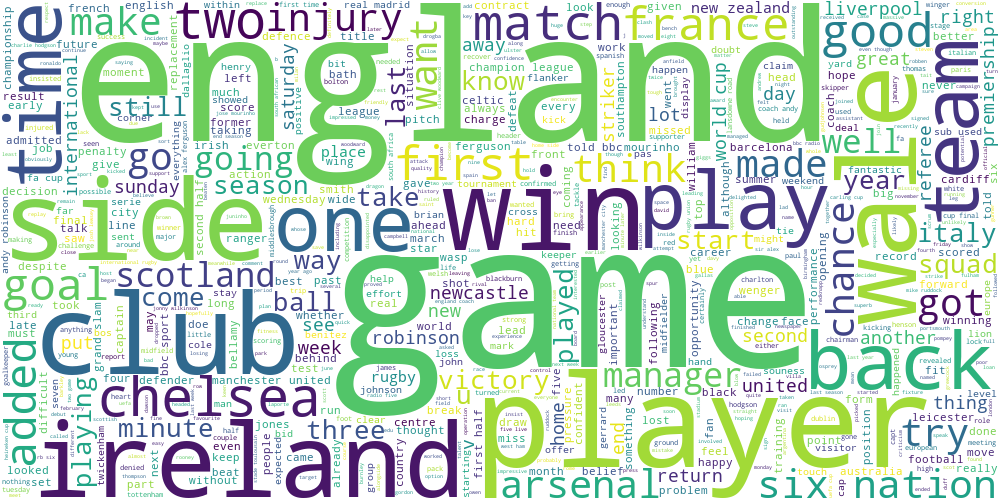

In [113]:
draw_wordcloud(data.text.loc[lda_labels==13])

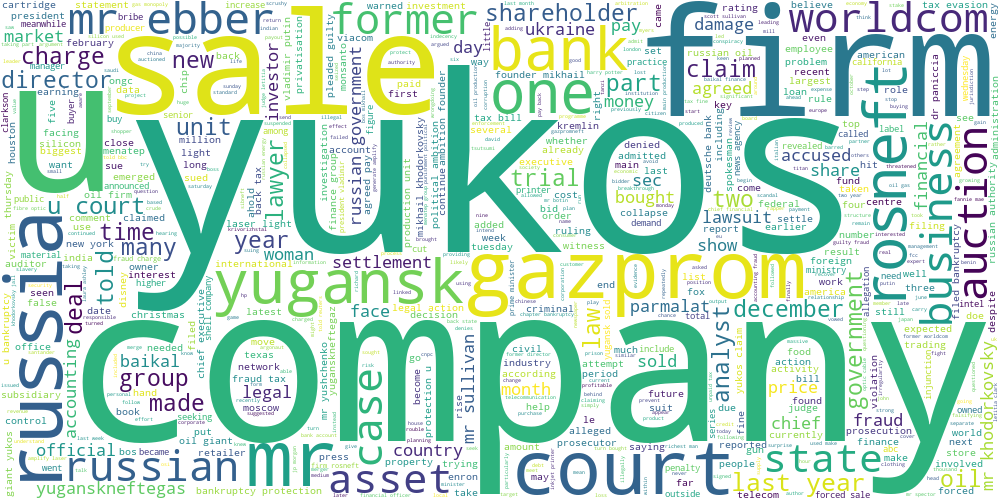

In [114]:
draw_wordcloud(data.text.loc[lda_labels==14])

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [42]:
y = data.category.copy()
y[y == 'business'] = 0
y[y == 'entertainment'] = 1
y[y == 'politics'] = 2
y[y == 'sport'] = 3
y[y == 'tech'] = 4
y = y.astype(int)

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
train_data, test_data, y_train, y_test = train_test_split(data.text, y, test_size=0.3, random_state=0)
tfidf = TfidfVectorizer(min_df=5)
X_train_tfidf = tfidf.fit_transform(train_data)
X_test_tfidf = tfidf.transform(test_data)
logreg = LogisticRegression().fit(X_train_tfidf, y_train)
print(f'Logreg + tfidf train accuracy is {accuracy_score(y_train, logreg.predict(X_train_tfidf))}')
print(f'Logreg + tfidf test accuracy is {accuracy_score(y_test, logreg.predict(X_test_tfidf))}')

Logreg + tfidf train accuracy is 0.9955041746949261
Logreg + tfidf test accuracy is 0.9730538922155688


In [44]:
kmeans = KMeans(random_state=0)
kmeans_dist_train = kmeans.fit_transform(X_train_tfidf)
kmeans_dist_test = kmeans.transform(X_test_tfidf)
kmeans_logreg = LogisticRegression().fit(kmeans_dist_train, y_train)
print(f'K-Means distance on tfidf + logreg train accuracy is {accuracy_score(y_train, kmeans_logreg.predict(kmeans_dist_train))}')
print(f'K-Means distance on tfidf + logreg test accuracy is {accuracy_score(y_test, kmeans_logreg.predict(kmeans_dist_test))}')

K-Means distance on tfidf + logreg train accuracy is 0.8638407193320488
K-Means distance on tfidf + logreg test accuracy is 0.8667664670658682


In [45]:
bow = CountVectorizer(min_df=5)
X_train_bow = bow.fit_transform(train_data)
X_test_bow = bow.transform(test_data)

lda = LatentDirichletAllocation(random_state=0)

lda_train = lda.fit_transform(X_train_bow)
lda_test = lda.transform(X_test_bow)

lda_logreg = LogisticRegression().fit(lda_train, y_train)
print(f'LDA + logreg train accuracy is {accuracy_score(y_train, lda_logreg.predict(lda_train))}')
print(f'LDA + logreg test accuracy is {accuracy_score(y_test, lda_logreg.predict(lda_test))}')

LDA + logreg train accuracy is 0.9332048811817598
LDA + logreg test accuracy is 0.9520958083832335


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучшее качество получилось у логрега с tfidf. Вообще это очень сильный бейзлайн, который сеткой не всегда легко побить. Но в данном случае в кластеризации мы брали дефолтное количество кластеров, что вообще говоря неправильно.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [46]:
data_train, data_valid, y_train, y_valid = train_test_split(train_data, y_train, test_size=0.3, random_state=0)
data_train_labeled, data_train_unlabeled, y_train_labeled, y_train_unlabeled = train_test_split(data_train, y_train, test_size=65 / 70, random_state=0)

In [47]:
tfidf = TfidfVectorizer(min_df=5).fit(data_train)
X_train_all = tfidf.transform(data_train)
X_train_labeled = tfidf.transform(data_train_labeled)
X_valid = tfidf.transform(data_valid)
X_test = tfidf.transform(test_data)

In [ ]:
import optuna

def objective(trial):
    logreg = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    logreg.fit(X_train_labeled, y_train_labeled)
    return accuracy_score(y_valid, logreg.predict(X_valid))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

In [49]:
logreg_tfidf = LogisticRegression(C=study.best_params['C']).fit(X_train_labeled, y_train_labeled)
print(f'Logreg + tfidf accuracy is {accuracy_score(y_test, logreg_tfidf.predict(X_test))}')

Logreg + tfidf accuracy is 0.907185628742515


In [ ]:
def objective(trial):
    kmeans = KMeans(n_clusters=trial.suggest_int('n_clusters', 3, 16), random_state=0)
    kmeans.fit(X_train_all)
    kmeans_dist_train = kmeans.transform(X_train_labeled)
    kmeans_dist_test = kmeans.transform(X_valid)
    logreg = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    logreg.fit(kmeans_dist_train, y_train_labeled)
    return accuracy_score(y_valid, logreg.predict(kmeans_dist_test))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

In [51]:
kmeans = KMeans(n_clusters=study.best_params['n_clusters'], random_state=0)
kmeans.fit(X_train_all)
kmeans_dist_train = kmeans.transform(X_train_labeled)
kmeans_dist_test = kmeans.transform(X_test)
logreg_kmeans = LogisticRegression(C=study.best_params['C']).fit(kmeans_dist_train, y_train_labeled)
print(f'K-Means distance on tfidf + logreg accuracy is {accuracy_score(y_test, logreg_kmeans.predict(kmeans_dist_test))}')

K-Means distance on tfidf + logreg accuracy is 0.8907185628742516


In [52]:
bow = CountVectorizer(min_df=5).fit(data_train)
X_train_all = bow.transform(data_train)
X_train_labeled = bow.transform(data_train_labeled)
X_valid = bow.transform(data_valid)
X_test = bow.transform(test_data)

In [ ]:
def objective(trial):
    lda = LatentDirichletAllocation(n_components=trial.suggest_int('n_clusters', 3, 30), random_state=0)
    lda.fit(X_train_all)
    lda_train = lda.transform(X_train_labeled)
    lda_test = lda.transform(X_valid)
    logreg = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    logreg.fit(lda_train, y_train_labeled)
    return accuracy_score(y_valid, logreg.predict(lda_test))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

In [54]:
lda = LatentDirichletAllocation(n_components=study.best_params['n_clusters'], random_state=0)
lda.fit(X_train_all)
lda_train = lda.transform(X_train_labeled)
lda_test = lda.transform(X_test)
logreg_lda = LogisticRegression(C=study.best_params['C']).fit(lda_train, y_train_labeled)
print(f'LDA + logreg accuracy is {accuracy_score(y_test, logreg_lda.predict(lda_test))}')

LDA + logreg accuracy is 0.9461077844311377


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Значения на логрег + tfidf понизились, потому что сильно уменьшилось количество данных для обучения. В то же время значения на K-Means и LDA остались примерно такими же: как мне кажется, произошло это из-за того, что теперь мы подобрали количество кластеров, но уменьшили количество данных для обучения логрега.

Можно сделать вывод, что если данных много, то логрег + tfidf -- оптимальное решение; если же размеченных данных мало, то LDA + логрег будет давать хорошее качество.

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [55]:
from sklearn.semi_supervised import SelfTrainingClassifier
from scipy.sparse import vstack

tfidf = TfidfVectorizer(min_df=5).fit(data_train)
X_train_all = tfidf.transform(data_train)
X_train_labeled = tfidf.transform(data_train_labeled)
X_train_unlabeled = tfidf.transform(data_train_unlabeled)
X_valid = tfidf.transform(data_valid)
X_test = tfidf.transform(test_data)
y_train_labeled = y_train_labeled.to_numpy()
y_train_unlabeled = y_train_unlabeled.to_numpy()
lab_unlab_y_train = np.hstack((y_train_labeled, -1 * np.ones_like(y_train_unlabeled)))
lab_unlab_X_train = vstack((X_train_labeled, X_train_unlabeled))

In [ ]:
def objective(trial):
    logreg = LogisticRegression(C=trial.suggest_float('C', 0, 10))
    stc = SelfTrainingClassifier(logreg, threshold=trial.suggest_float('threshold', 0.5, 1.0)).fit(lab_unlab_X_train, lab_unlab_y_train)
    return accuracy_score(y_valid, stc.predict(X_valid))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

In [57]:
logreg = LogisticRegression(C=study.best_params['C'])
stc = SelfTrainingClassifier(logreg, threshold=study.best_params['threshold']).fit(lab_unlab_X_train, lab_unlab_y_train)
accuracy_score(y_test, stc.predict(X_test))

0.9535928143712575

In [ ]:
from sklearn.semi_supervised import LabelPropagation

def objective(trial):
    label_prop_model = LabelPropagation(gamma=trial.suggest_int('gamma', 1, 50, step=5)).fit(lab_unlab_X_train.toarray(), lab_unlab_y_train)
    return accuracy_score(y_valid, label_prop_model.predict(X_valid.toarray()))

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

In [59]:
label_prop_model = LabelPropagation(gamma=study.best_params['gamma']).fit(lab_unlab_X_train.toarray(), lab_unlab_y_train)
accuracy_score(y_test, label_prop_model.predict(X_test.toarray()))

0.9161676646706587

__Ответ__: Применив Self-Training удалось улучшить accuracy по сравнению с LDA + логрег. Подход LabelPropagation улучшения не дал, но в целом он не сильно отстаёт.

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [60]:
def BCubed(y_true, y_pred):
    if y_true.shape != y_pred.shape:
        raise ValueError('y_true and y_pred must be same shape')
    l = y_true.shape[0]
    correctness = np.zeros((l, l))
    for i in range(l):
        for j in range(i, l):
            correctness[i, j] = (y_true[i] == y_true[j]) * (y_pred[i] == y_pred[j])
            correctness[j, i] = correctness[i, j]
    precision, recall = np.zeros((l, )), np.zeros((l, ))
    for k in np.unique(y_pred):
        precision += correctness[:, np.argwhere(y_pred == k)[:, 0]].mean(1)
    precision = precision.mean()
    for k in np.unique(y_true):
        recall += correctness[np.argwhere(y_true == k)[:, 0], :].mean(0)
    recall = recall.mean()
    return 2 * precision * recall / (recall + precision)

In [61]:
BCubed(y_test.to_numpy(), logreg_tfidf.predict(X_test))

0.833683736731264

In [62]:
BCubed(y_test.to_numpy(), logreg_kmeans.predict(kmeans_dist_test))

0.8099897704080846

In [63]:
BCubed(y_test.to_numpy(), logreg_lda.predict(lda_test))

0.8973406031787678

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [64]:
import torch
import torchvision
from torchvision import transforms

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(32),
    lambda x: (x * 2) - 1
])

data_train = torchvision.datasets.MNIST(root='/Users/free001style/Library/Mobile Documents/com~apple~CloudDocs/HSE/HSE_/ML/unsupervised/', transform=transform, download=True)
data_test = torchvision.datasets.MNIST(root='/Users/free001style/Library/Mobile Documents/com~apple~CloudDocs/HSE/HSE_/ML/unsupervised/', download=True, train=False, transform=transform)

In [65]:
X_train = np.zeros((60000, 1024))
y_train = np.zeros((60000, ))
for i in range(60000):
    X_train[i, :] = data_train[i][0].squeeze().ravel()
    y_train[i] = data_train[i][1]

X_test = np.zeros((10000, 1024))
y_test = np.zeros((10000, ))
for i in range(10000):
    X_test[i, :] = data_test[i][0].squeeze().ravel()
    y_test[i] = data_test[i][1]

In [71]:
kmeans_labels_test = KMeans(10, random_state=0).fit_predict(X_test)

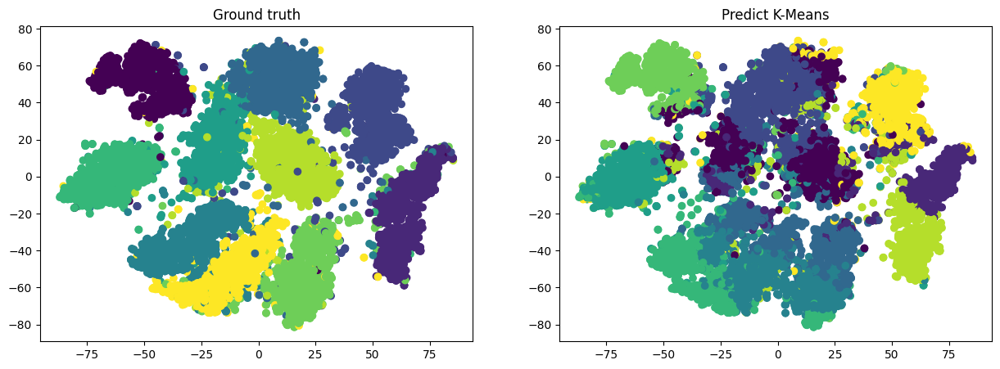

In [72]:
X_test_tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_test)
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=y_test)
ax[0].set_title('Ground truth')
ax[1].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=kmeans_labels_test)
ax[1].set_title('Predict K-Means')
plt.show()

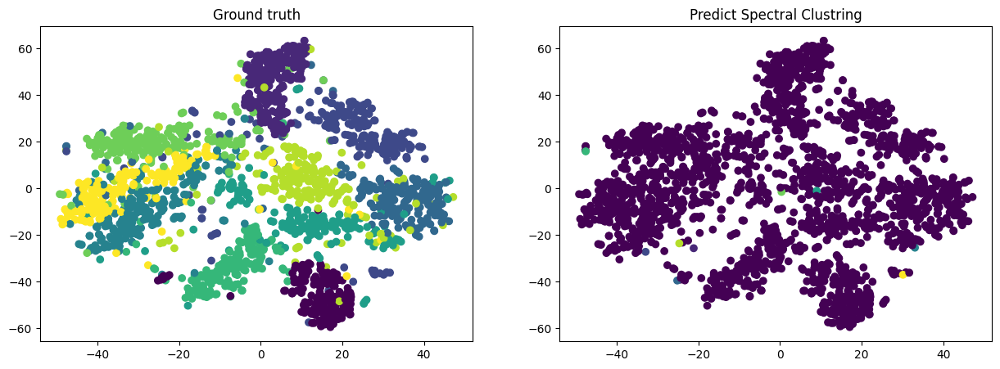

In [115]:
spec_labels_test = SpectralClustering(10).fit_predict(X_test[:2000, :])
X_test_tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_test[:2000, :])
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=y_test[:2000])
ax[0].set_title('Ground truth')
ax[1].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=spec_labels_test)
ax[1].set_title('Predict Spectral Clustring')
plt.show()

In [76]:
from torch import nn

class Block(nn.Module):
    def __init__(self, in_features, out_features, kernel_size=3, stride=2, upsample=False, skip = False):
        super().__init__()
        if upsample:
            self.conv = nn.Sequential(
                nn.Conv2d(in_features, out_features, kernel_size, padding=(kernel_size - 1) // 2, bias=False),
                nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            )
        else:
            self.conv = nn.Conv2d(in_features, out_features, kernel_size, stride, padding=(kernel_size - 1) // 2, bias=False)
        self.skip = skip
        self.batch_norm = nn.BatchNorm2d(out_features)
        self.relu = nn.GELU()
        self.dropout = nn.Dropout(0.1)
        
    def forward(self, x):
        out = self.conv(x)
        out = 0.95 * out + 0.05 * torch.rand_like(out)
        out = self.dropout(out)
        return self.relu(self.batch_norm(out))

In [77]:
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            Block(1, 4),
            Block(4, 12),
            Block(12, 24), 
            Block(24, 44),
            Block(44, 64).conv
            )
    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            Block(64, 44, upsample=True),
            Block(44, 24, upsample=True),
            Block(24, 12, upsample=True), 
            Block(12, 4, upsample=True), 
            Block(4, 1, upsample=True).conv
            )
        self.tanh = nn.Tanh()
    def forward(self, x):
        x = self.decoder(x)
        return self.tanh(x)

In [78]:
device = 'cuda' if torch.cuda.is_available() else 'mps'

In [79]:
from tqdm.notebook import tqdm

def train(loader, optim, encoder, decoder, device):
    encoder.train()
    decoder.train()
    losses = []
    for image, _ in tqdm(loader):
        optim.zero_grad()
        image = image.to(device)
        output = decoder(encoder(image))
        loss = nn.MSELoss()(image, output)
        loss.backward()
        optim.step()
        losses.append(loss.item())
    return sum(losses) / len(losses)

@torch.no_grad()
def eval(loader, encoder, decoder, device):
    encoder.eval()
    decoder.eval()
    losses = []
    for image, _ in tqdm(loader, leave=False):
        image = image.to(device)
        ouput = decoder(encoder(image))
        loss = nn.MSELoss()(image, ouput)
        losses.append(loss.item())
    return sum(losses) / len(losses)

In [80]:
from torch.utils.data import DataLoader

train_loader = DataLoader(data_train, batch_size=32, shuffle=True)
test_loader = DataLoader(data_test, batch_size=32, shuffle=False)

In [81]:
from IPython.display import clear_output

encoder = Encoder().to(device)
decoder = Decoder().to(device)
def full_train(train_loader, val_loader):
    params = list(encoder.parameters()) + list(decoder.parameters())
    optim = torch.optim.AdamW(params)
    train_loss = []
    val_loss = []
    n_epochs = 30
    for e in tqdm(range(n_epochs)):
        e_train_loss = train(train_loader, optim, encoder, decoder, device)
        train_loss.append(e_train_loss)
        e_val_loss = eval(val_loader, encoder, decoder, device)
        val_loss.append(e_val_loss)
        clear_output(wait=True)
        print(f'Epoch: {e+1}/{n_epochs}')
        print(f'Train MSE loss: {e_train_loss:.4f}')
        print(f'Validation MSE loss: {e_val_loss:.4f}')
        plt.plot(train_loss, label='train')
        plt.plot(val_loss, label='val')
        plt.legend()
        plt.title('MSE Loss')
        plt.show()
    torch.save(encoder.state_dict(), 'encoder.pt')
    torch.save(decoder.state_dict(), 'decoder.pt')

Epoch: 30/30
Train MSE loss: 0.0756
Validation MSE loss: 0.0452


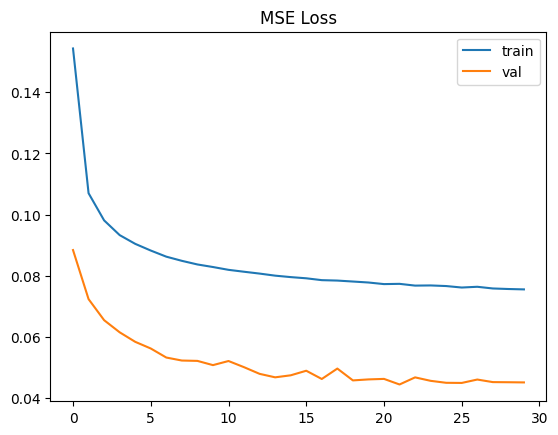

In [171]:
full_train(train_loader, test_loader)

In [96]:
X_test_tensor = torch.zeros((10000, 1, 32, 32))
for i in range(10000):
    X_test_tensor[i, ...] = data_test[i][0]

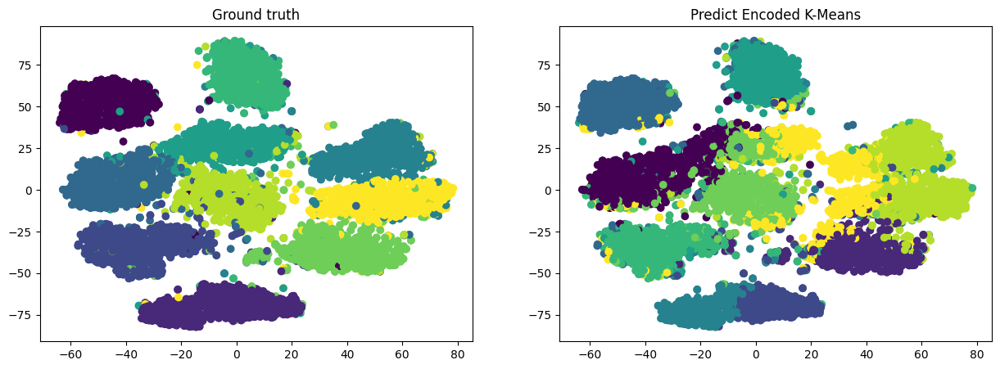

In [98]:
encoder = Encoder().to(device)
encoder.load_state_dict(torch.load('encoder.pt'))
X_encoded_test = encoder(X_test_tensor.to(device)).detach().cpu().numpy().squeeze()

kmeans_labels = KMeans(10, random_state=0).fit_predict(X_encoded_test)

X_test_tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_encoded_test)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=y_test)
ax[0].set_title('Ground truth')
ax[1].scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=kmeans_labels)
ax[1].set_title('Predict Encoded K-Means')
plt.show()

Как мне кажется, AE + K-Means отработал получше, чем просто K-Means, и уж тем более лучше, чем спектральная кластеризация (хз, что с ней случилось).

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).